In [4]:
import numpy as np
import matplotlib.pyplot as plt
import h5py
import random
from collections import Counter
from os import system,remove 
from scipy.stats import skew
from scipy.stats import kurtosis
from glob import glob

In [17]:
def split_list(l, n):
  # 將list分割 (l:list, n:每個matrix裡面有n個元素)
  for idx in range(0, len(l), n):
    yield l[idx:idx+n]

def Average_list(D_list=[],j_list=[]):
    Nor_J=[]
    Nor_D=[]
    Nor_I=[]
    for i in range(len(D_list)):
        a=0
        for j in range(len(Nor_D)):
            if(D_list[i]==Nor_D[j]):
                Nor_I[j]+=1
                Nor_J[j]+=j_list[i]
                a=a+1
        if(a==0):
            Nor_D.append(D_list[i])
            Nor_I.append(1)
            Nor_J.append(j_list[i])
    for i in range(len(Nor_J)):
        Nor_J[i]=Nor_J[i]/Nor_I[i]
    return Nor_D,Nor_J
def readcv(fn,beta,datalist):
    with h5py.File(fn, "r") as f:
        E=list(f['E'][:])
        E2=list(f['E2'][:])
        ME=list(f['ME'][:])
        M=list(f['Mtotal'][:])
    datalist.append(E[0])
    datalist.append(M[0])
    datalist.append(beta*beta*(E2[0]-E[0]*E[0]))
    datalist.append(beta*beta*(ME[0]-E[0]*M[0]))

def readaC(fn,beta,aClist):
    with h5py.File(fn, "r") as f:
        aClist.append(f['c'][()])
        aClist.append(f['aC3'][()])
        aClist.append(f['aC4'][()])

def stringN(filename):
    # print(fn[0])
    # print(fn[0].index('l'))
    # print(fn[0].split('/')[-1])
    n=filename.split('/')[-1]
    n=n.split('blresult_')[1]
    n=n.split('.npz')[0]
    return n
def split_filename(n):
    lindex=n.index('l')
    Bindex=n.index('B')
    aindex=n.index('a')
    hindex=n.index('h')
    filenumberindex=n.index('_')
    # npzindex=n.index('.')
    l=n[lindex+1:Bindex]
    B=n[aindex+1:hindex]
    h=n[hindex+1:filenumberindex]
    filenumb=n[filenumberindex+1:]
    # print("l ="+l)
    # print("beta = " + B)
    # print("h = " + h)
    # print("filenumber = " + filenumb)
    return l,B,h,filenumb

# print(fn[0][38])
def plotcv(betas,ising_index,title,datalist):
    plt.plot(betas,datalist[0::4])
    plt.xlabel('beta')
    plt.ylabel('E')
    plt.title(f'{title}betacri{betas[ising_index]:.04g}')
    plt.axvline(betas[ising_index],color = 'r',ls='--')
    plt.figure()

    plt.plot(betas,datalist[1::4])
    plt.xlabel('beta')
    plt.ylabel('M')
    plt.title(f'{title}betacri{betas[ising_index]:.04g}')
    plt.axvline(betas[ising_index],color = 'r',ls='--')
    plt.figure()

    plt.plot(betas,datalist[2::4])
    plt.xlabel('beta')
    plt.ylabel('cv')
    plt.title(f'{title}betacri{betas[ising_index]:.04g}')
    plt.axvline(betas[ising_index],color = 'r',ls='--') 
    plt.figure()

    plt.plot(betas,datalist[3::4])
    plt.xlabel('beta')
    plt.ylabel('dMdT')
    plt.title(f'{title}betacri{betas[ising_index]:.04g}')
    plt.axvline(betas[ising_index],color = 'r',ls='--') 
    plt.figure()

def readblresult_callsspin2(n,betas,aclist,datalist=[]):
    linear_size,betacri,field,filenumber=split_filename(n)
    draw_list3=[]
    draw_list4=[]
    filename=f'selection_mc/aC4/statics_l{linear_size}Beta{betacri}h{field}.h5'
    with h5py.File(filename, "r") as f:
        draw_list3.append(f['draw_list3'][()])
        draw_list4.append(f['draw_list4'][()])

    data = np.load(f'blresult/aC4/blresult_{n}.npz',allow_pickle=True)
    state=data['state'][()]
    h=state['hjbest'][:64]
    j=state['hjbest'][64:]

    filename=f'input/aC4/input_file_{n}.h5'
    with h5py.File(filename, "w") as f:
    # f.create_dataset('h',data=h)
    # f.create_dataset('j',data=j)
        f['h']=h
        f['j']=j
        f['draw_list3']=draw_list3[0]
        f['draw_list4']=draw_list4[0]
    error=data['error'][()]
    # print(draw_list3)
    
    # n=f'l{linear_size:.04g}Beta{betacri:.04g}h{field:.04g}_{filenumber}'
    

    # ploterror_j(error,j,n)
    
    niter=100000
    for beta in betas:
        prmf=filename
        datf = f'output/aC4/output_l{linear_size}Betacri{betacri}Beta{beta:.04g}h{field}_{filenumber}.h5'
        system(f'nice -n +20 ./sspin2 {prmf} {datf} {niter} --beta={beta:.04g}')
        # with h5py.File(datf, "r") as f:
        #     E = f['result1']['aE'][()]
        #     E2 =f['result1']['aE2'][()]
        #     M=f['result1']['aM'][()]
        #     ME=f['result1']['aME'][()]
        #     aC=f['result1']['aC'][()]
        #     aC3=f['result1']['aC3'][()]
        #     aC4=f['result1']['aC4'][()]
            

        #     datalist.append(E/cnt)
        #     datalist.append(M/cnt)
        #     datalist.append(beta*beta*(E2/cnt-E*E/cnt/cnt))
        #     datalist.append(beta*beta*(ME/cnt-E*M/cnt/cnt))
        #     aclist.append(aC)
        #     aclist.append(aC3)
        #     aclist.append(aC4)

def readouput(n,isingbetas,sspinbetas,sspindatalist,sspinaClist,isingdatalist,isingaClist):
    linear_size,betacri,field,filenumber=split_filename(n)

    
    for beta in sspinbetas:
        outputfile= f'output/output_aC4/output_l{linear_size}Betacri{betacri}Beta{beta:.04g}h{field}_{filenumber}.h5'
        with h5py.File(outputfile, "r") as f:
            E = f['result1']['aE'][()]
            E2 =f['result1']['aE2'][()]
            M=f['result1']['aM'][()]
            ME=f['result1']['aME'][()]
            aC=f['result1']['aC'][()]
            aC3=f['result1']['aC3'][()]
            aC4=f['result1']['aC4'][()]
            cnt=f['result1']['cnt'][()]

            sspindatalist.append(E/cnt/float(betacri)/64)
            sspindatalist.append(M/cnt/64)
            sspindatalist.append(beta*beta*(E2/cnt-E/cnt*E/cnt)/64)
            sspindatalist.append(beta*beta*(ME/cnt-E/cnt*M/cnt)*float(betacri)/64)
            sspinaClist.append(aC)
            sspinaClist.append(aC3)
            sspinaClist.append(aC4)

    # filename=f'input/aC4/input_file_{n}.h5'
    
    for beta in isingbetas:
        filename=f'selection_mc/aC4/statics_l{linear_size}Beta{beta:.04g}h{field}.h5'
        with h5py.File(filename, "r") as f:
            E = f['E'][()]
            E2 =f['E2'][()]
            M=f['Mtotal'][()]
            ME=f['ME'][()]

            isingdatalist.append(E/int(linear_size)/int(linear_size))
            isingdatalist.append(M/int(linear_size)/int(linear_size))
            isingdatalist.append(beta*beta*(E2-E*E)/int(linear_size)/int(linear_size))
            isingdatalist.append(beta*beta*(ME-E*M)/int(linear_size)/int(linear_size))
    

    for beta in isingbetas:
        filename=f'selection_mc/aC4/subsample_l{linear_size}Beta{betacri}h{field}_{filenumber}.h5'
        with h5py.File(filename, "r") as f:
           
            aC=f['c'][()]
            aC3=f['aC3'][()]
            aC4=f['aC4'][()]

      
            isingaClist.append(aC)
            isingaClist.append(aC3)
            isingaClist.append(aC4)

    data = np.load(f'blresult/aC4/blresult_{n}.npz',allow_pickle=True)
    state=data['state'][()]
    h=state['hjbest'][:64]
    j=state['hjbest'][64:]
    error=data['error'][()]


    

    sspin_index=np.argmin(np.abs(np.array(sspinbetas)-(1)))
    ising_index=np.argmin(np.abs(np.array(isingdatalist[2::4])-max(isingdatalist[2::4])))

    new_isingbetas=[B/isingbetas[ising_index] for B in isingbetas ]
    isingT=[1/B for B in new_isingbetas]

    sspinT=[1/B for B in sspinbetas]
    
    # ploterror_j(n)
    plot_all(sspin_index,ising_index,sspinaClist,isingaClist,n)
    plot_compare(sspin_index,ising_index,isingT,sspinT,sspindatalist,isingdatalist,n)
    
    

def plot_compare(sspin_index,ising_index,isingT,sspinT,sspindatalist,isingdatalist,n):
    plt.plot(isingT,isingdatalist[0::4],label='ising')
    plt.plot(sspinT,sspindatalist[0::4],label='sspin')
    plt.xlabel('T')
    plt.ylabel('E')
    plt.title(f'{n}')
    plt.axvline(isingT[ising_index],color = 'r',ls='--')
    plt.axvline(sspinT[sspin_index],color = 'y',ls='--')
    plt.legend()
    plt.figure()

    plt.plot(isingT,isingdatalist[1::4],label='ising')
    plt.plot(sspinT,sspindatalist[1::4],label='sspin')
    plt.xlabel('T')
    plt.ylabel('M')
    plt.title(f'{n}')
    plt.axvline(isingT[ising_index],color = 'r',ls='--')
    plt.axvline(sspinT[sspin_index],color = 'y',ls='--')
    plt.legend()
    plt.figure()

    plt.plot(isingT,isingdatalist[2::4],label='ising')
    plt.plot(sspinT,sspindatalist[2::4],label='sspin')
    plt.xlabel('T')
    plt.ylabel('cv')
    plt.title(f'{n}')
    plt.axvline(isingT[ising_index],color = 'r',ls='--') 
    plt.axvline(sspinT[sspin_index],color = 'y',ls='--')
    plt.legend()
    plt.figure()

    plt.plot(isingT,isingdatalist[3::4],label='ising')
    plt.plot(sspinT,sspindatalist[3::4],label='sspin')
    plt.xlabel('T')
    plt.ylabel('dMdT')
    plt.title(f'{n}')
    plt.axvline(isingT[ising_index],color = 'r',ls='--') 
    plt.axvline(sspinT[sspin_index],color = 'y',ls='--')
    plt.legend()
    plt.figure()

def plot_all(sspin_index,ising_index,sspinaClist,isingaClist,n):

    data = np.load(f'blresult/aC4/blresult_{n}.npz',allow_pickle=True)
    state=data['state'][()]
    error=data['error'][()]
    h=state['hjbest'][:64]
    j=state['hjbest'][64:]

    linear_size,betacri,field,filenumber=split_filename(n)

    filename=f'selection_mc/aC4/subsample_{n}.h5'
    with h5py.File(filename, "r") as f:
        m=f['m'][()]
        c=f['c'][()]

    plt.plot(error['mses'])
    plt.title(f'Error_{n}')
    plt.xlabel('epoch')
    plt.ylabel('error')

    plt.yscale('log')
    plt.xscale('log')
    plt.figure()

    plt.hist(h,bins=10,color = 'orange',label=f'excess kurtosis={kurtosis(h):.04g}\nskew={skew(h):.04g}\nmean={np.mean(h):.04g}\nstd={np.std(h):.04g}')
    plt.xlabel('h')
    plt.ylabel('times')
    # plt.yscale('log')
    plt.title(f'h distribution_{n}')
    plt.legend()
    plt.figure()

    plt.hist(m,bins=10,label=f'excess kurtosis={kurtosis(m):.04g}\nskew={skew(m):.04g}\nmean={np.mean(m):.04g}\nstd={np.std(m):.04g}')
    plt.xlabel('m')
    plt.ylabel('times')
    # plt.yscale('log')
    plt.title(f'm distribution_{n}')
    plt.legend()
    plt.figure()





    if filenumber =='0':
        j0list=[]
        j1list=[]
        for i in range(len(j)):
            if j[i]<0.3:
                j0list.append(j[i])
            else:
                j1list.append(j[i])

        plt.hist(j,bins=100,color = 'orange',label=f'excess kurtosis={kurtosis(j):.04g}\nskew={skew(j):.04g}\n left J mean={np.mean(j0list):.04g}\n left J std={np.std(j0list):.04g}\n right J mean={np.mean(j1list):.04g}\n right J std={np.std(j1list):.04g}')
        plt.yscale('log')
        plt.title(f'j distribution_{n}')
        plt.xlabel(f'j * beta_c = {betacri}')
        plt.ylabel('times')
        plt.legend()
        plt.figure()
    else :

        plt.hist(j,bins=100,color = 'orange',label=f'excess kurtosis={kurtosis(j):.04g}\nskew={skew(j):.04g}\n J mean={np.mean(j):.04g}\n J std={np.std(j):.04g}')
        plt.yscale('log')
        plt.xlabel(f'j * beta_c = {betacri}') 
        plt.ylabel('times')
        plt.title(f'j distribution_{n}')
        plt.legend()
        plt.figure()


    plt.hist(c,bins=100,label=f'excess kurtosis={kurtosis(c):.04g}\nskew={skew(c):.04g}\n c mean={np.mean(c):.04g}\n c std={np.std(c):.04g}')
    plt.yscale('log')
    plt.xlabel(f'c') 
    plt.ylabel('times')
    plt.title(f'c distribution_{n}')
    plt.legend()
    plt.figure()


    fig, ax = plt.subplots(2,2,constrained_layout = True)
    ax[0,0].set_title('aC')
    ax[0,0].set_xlabel('spin')
    ax[0,0].set_ylabel('ising')
    ax[0,0].plot(x:=sspinaClist[sspin_index*3],isingaClist[ising_index*3],'.',label=f'sspin_{n}',)
    x=[x.min(), x.max()]
    ax[0,0].plot(x,x,color='r')

    ax[0,1].set_title('aC3')
    ax[0,1].set_xlabel('spin')
    ax[0,1].set_ylabel('ising')
    ax[0,1].plot(x:=sspinaClist[sspin_index*3+1],isingaClist[ising_index*3+1],'.',label=f'sspin_{n}',)
    x=[x.min(), x.max()]
    ax[0,1].plot(x,x,color='r')
    
    ax[1,1].set_title('aC4')
    ax[1,1].set_xlabel('spin')
    ax[1,1].set_ylabel('ising')
    ax[1,1].plot(x:=sspinaClist[sspin_index*3+2],isingaClist[ising_index*3+2],'.',label=f'sspin_{n}',)
    x=[x.min(), x.max()]
    ax[1,1].plot(x,x,color='r')
    plt.figure()




# def ploterror_j(n):





In [3]:
betas=np.linspace(0.25,2,200)
file=glob('selection_mc/aC4/statics_l8*h-0.3.h5')
i=0
# print(betas)
print(len(file))
for fn in file:
    for beta in betas:
        if beta>1:
            if f'Beta{beta:.04g}h'in fn:
                print(fn)
                i=i+1
print(i)

156
selection_mc/aC4/statics_l8Beta1.191h-0.3.h5
selection_mc/aC4/statics_l8Beta1.956h-0.3.h5
selection_mc/aC4/statics_l8Beta1.015h-0.3.h5
selection_mc/aC4/statics_l8Beta1.868h-0.3.h5
selection_mc/aC4/statics_l8Beta1.279h-0.3.h5
selection_mc/aC4/statics_l8Beta2h-0.3.h5
selection_mc/aC4/statics_l8Beta1.147h-0.3.h5
selection_mc/aC4/statics_l8Beta1.235h-0.3.h5
selection_mc/aC4/statics_l8Beta1.103h-0.3.h5
selection_mc/aC4/statics_l8Beta1.912h-0.3.h5
selection_mc/aC4/statics_l8Beta1.059h-0.3.h5
selection_mc/aC4/statics_l8Beta1.824h-0.3.h5
12


In [24]:
file=glob('selection_mc/aC4/statics_l8Beta1.574h-0.3.h5')
print(len(file))

1


In [3]:
file=glob('blresult/aC4/blresult_*.npz')
# print(len(file))
betas=np.linspace(0.25,2,80)
sspindata=[]
sspinaClist=[]
for fn in file:
    n=stringN(fn)
    # print(n)
    readblresult_callsspin2(n,betas,sspinaClist,sspindata)

/tmp/ipykernel_1894419/2419731179.py:244: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


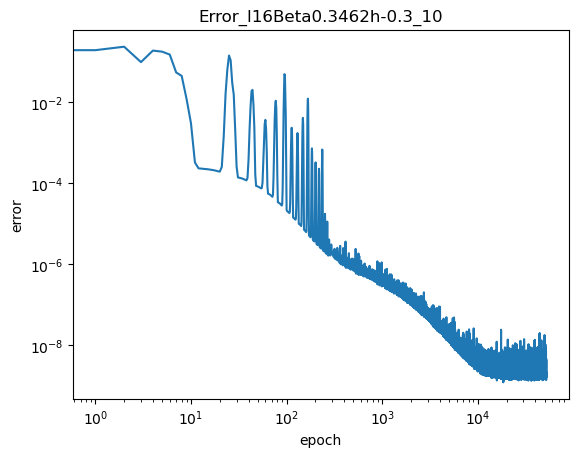

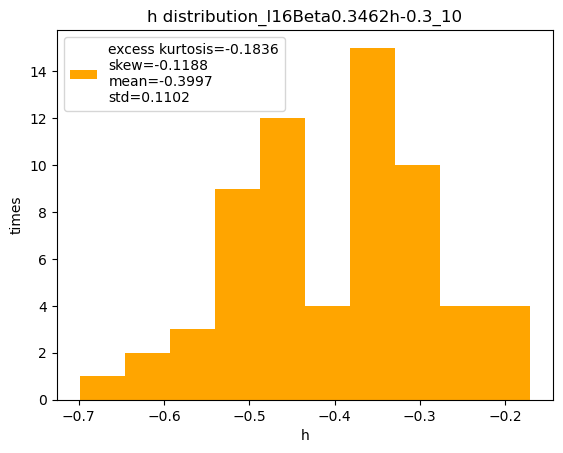

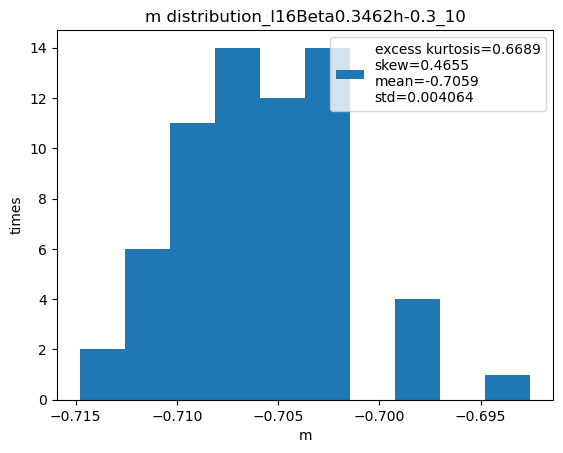

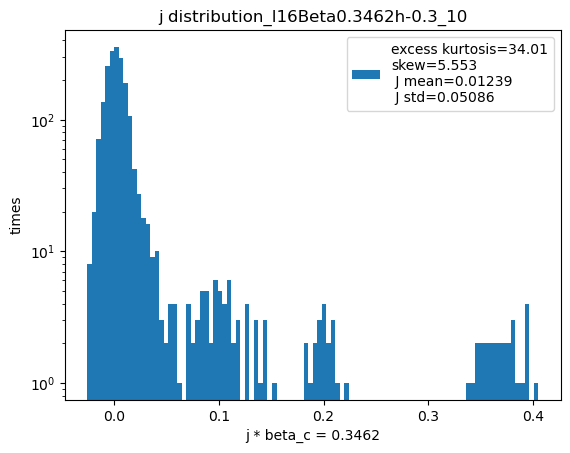

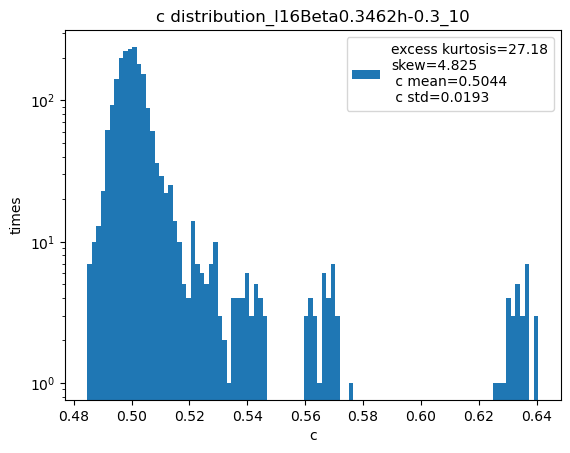

<Figure size 640x480 with 0 Axes>

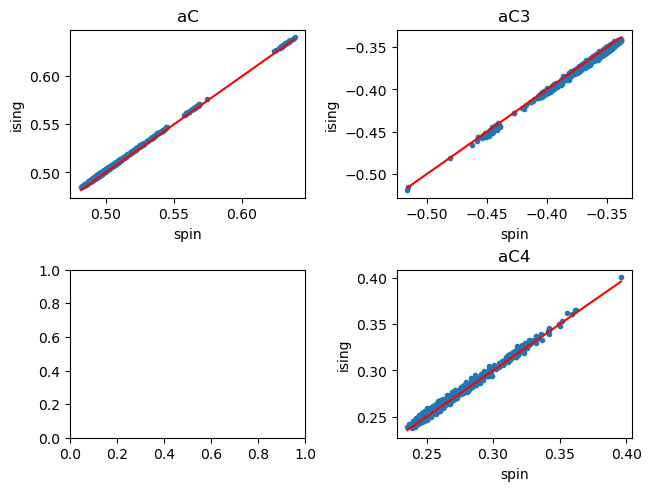

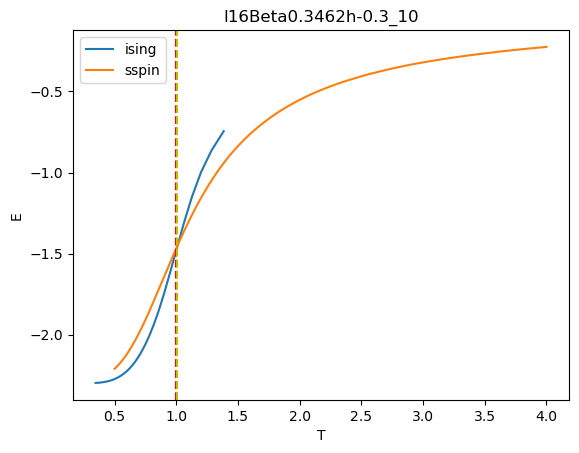

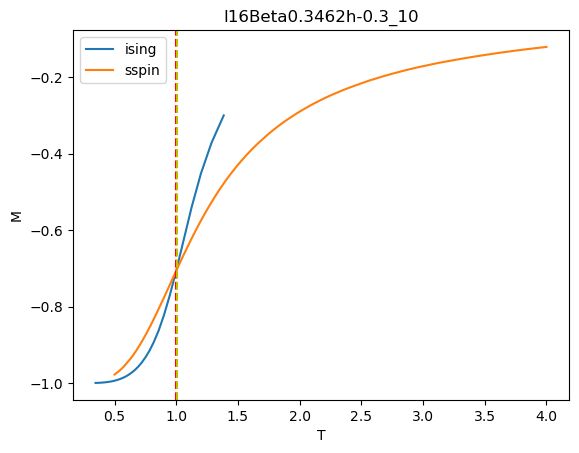

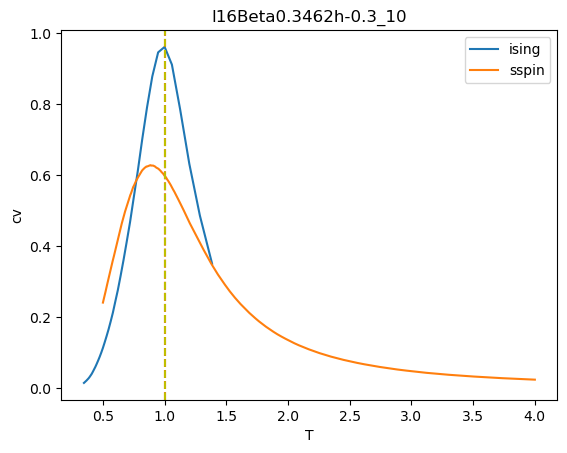

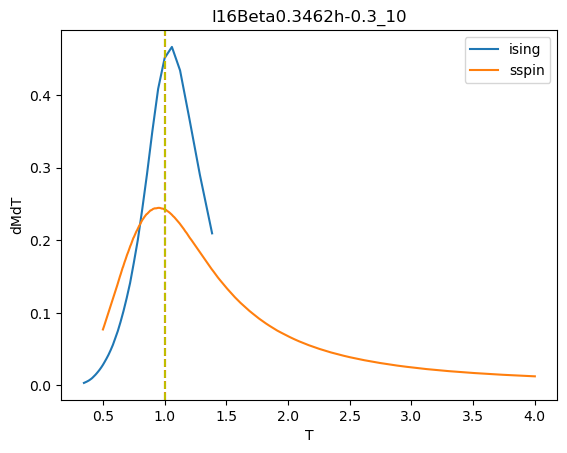

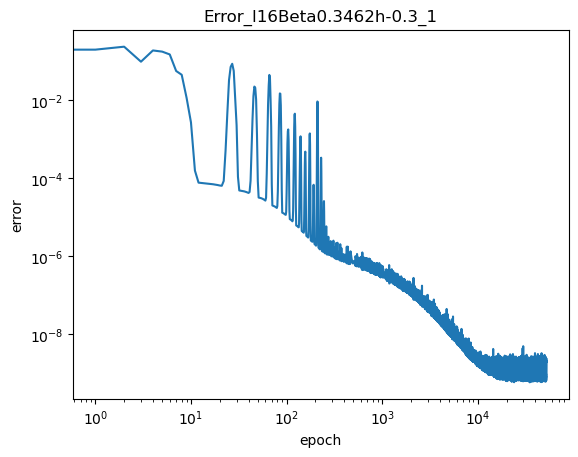

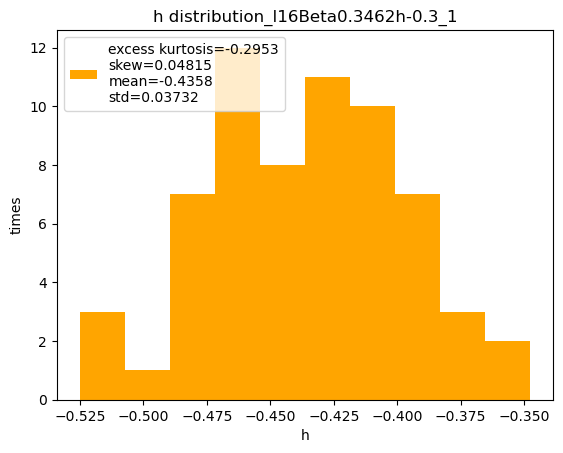

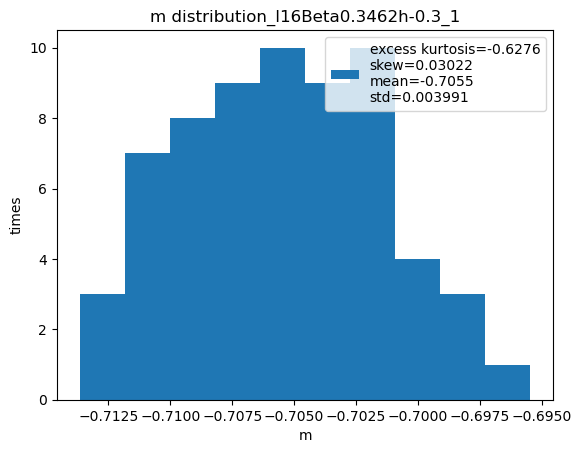

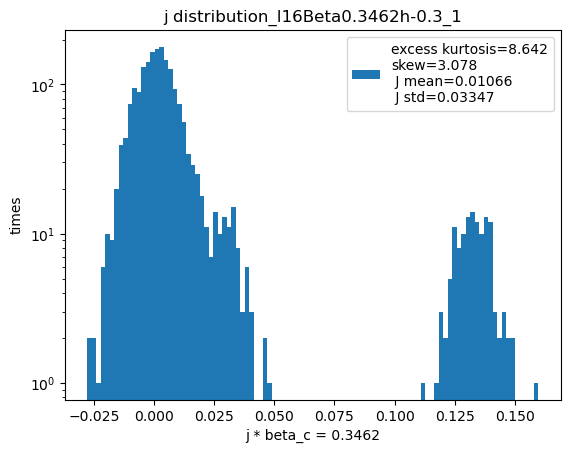

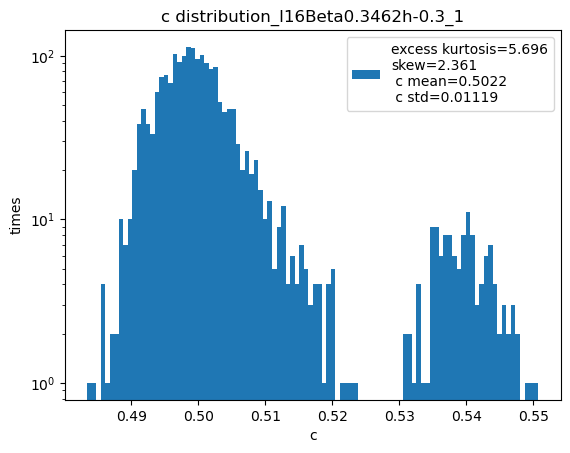

<Figure size 640x480 with 0 Axes>

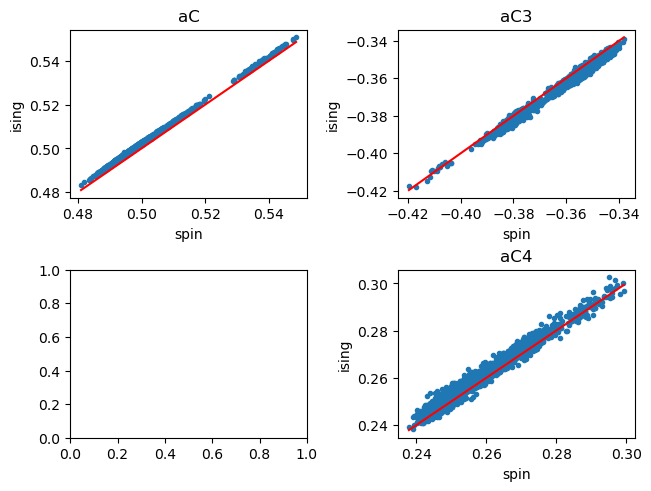

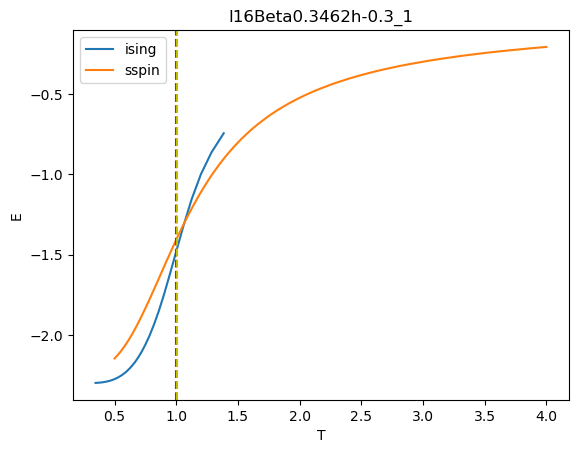

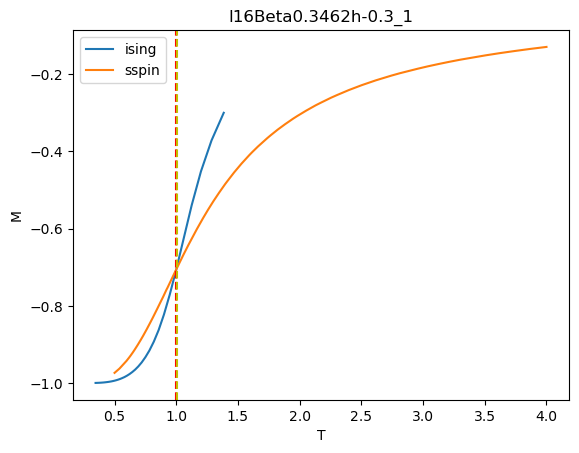

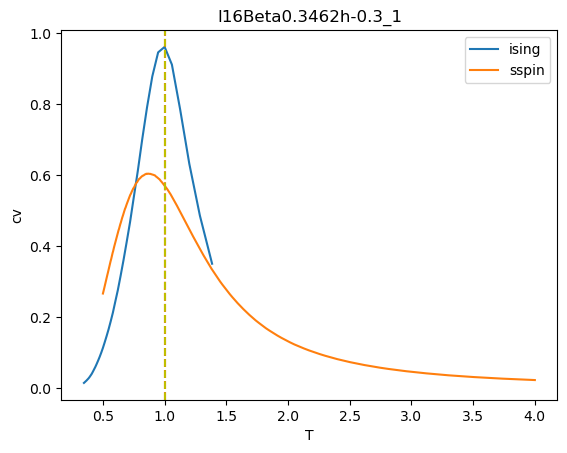

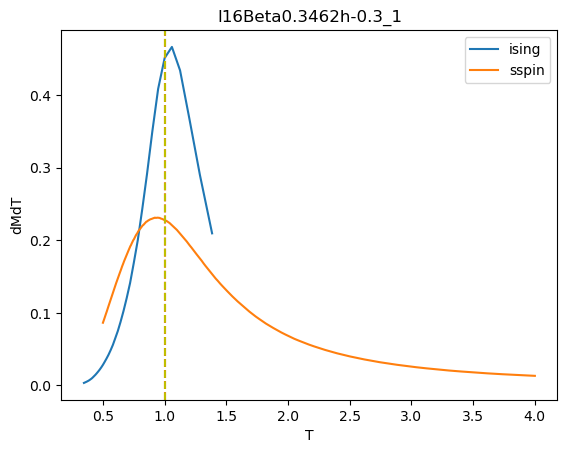

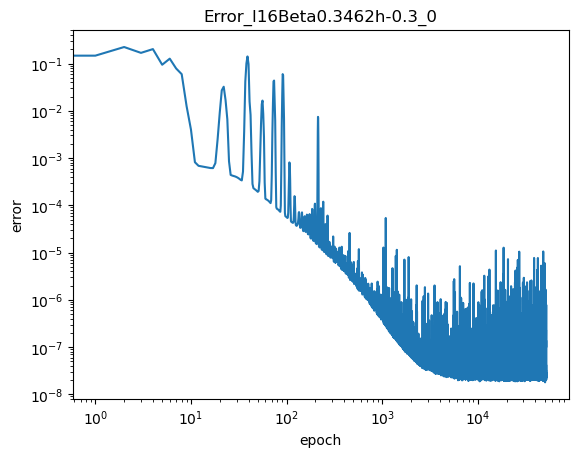

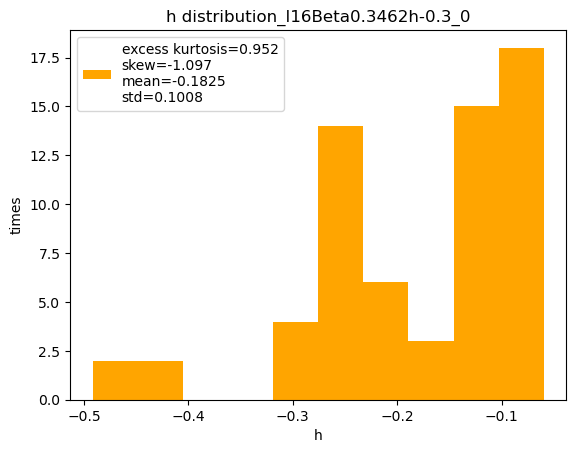

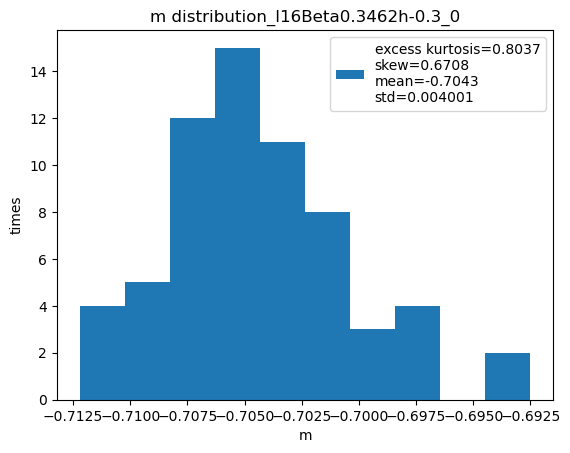

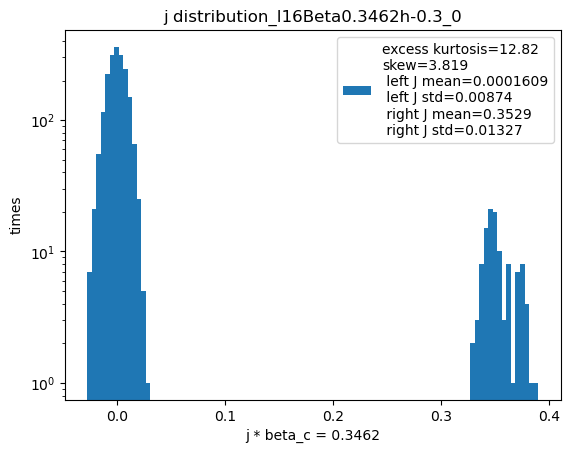

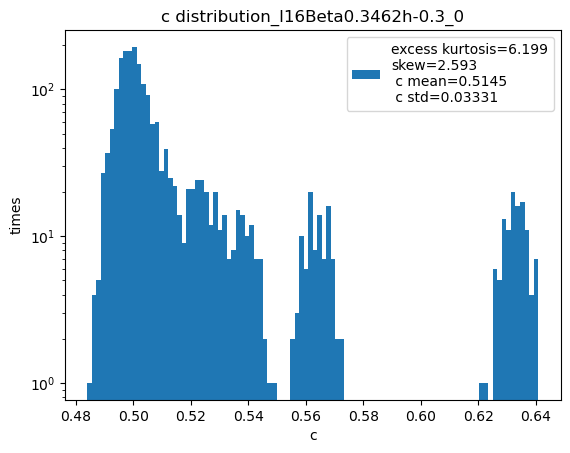

<Figure size 640x480 with 0 Axes>

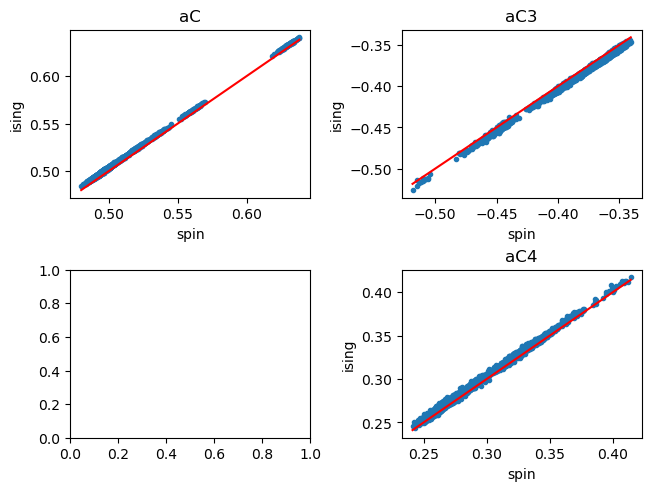

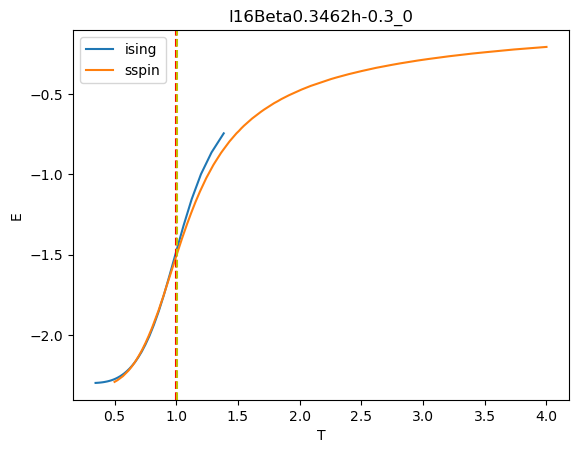

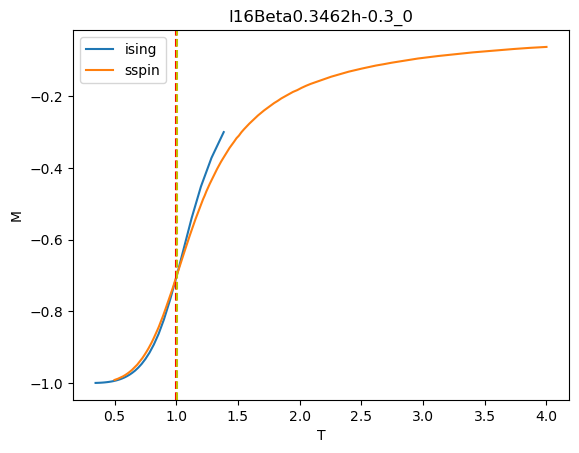

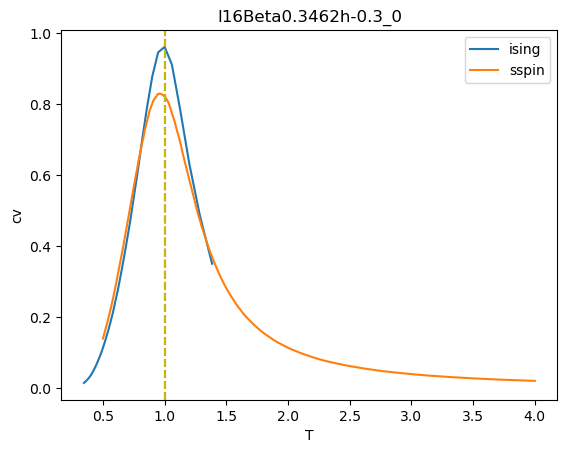

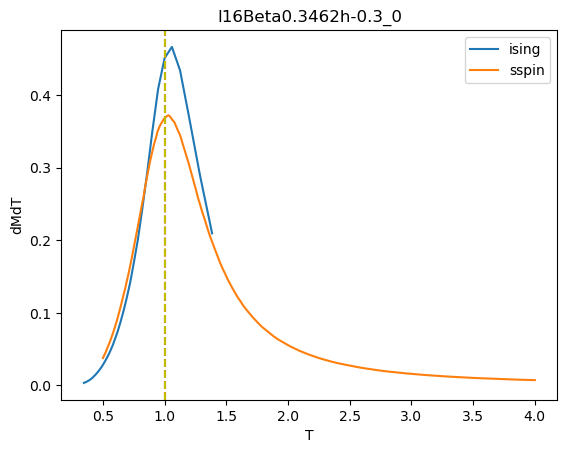

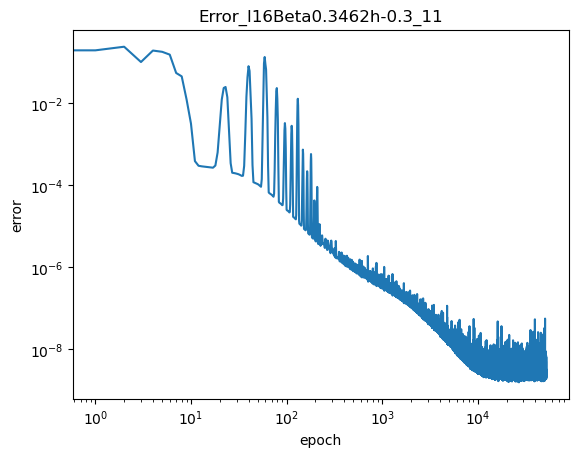

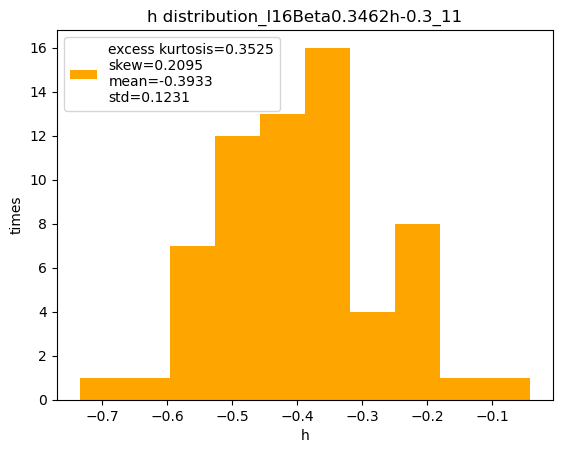

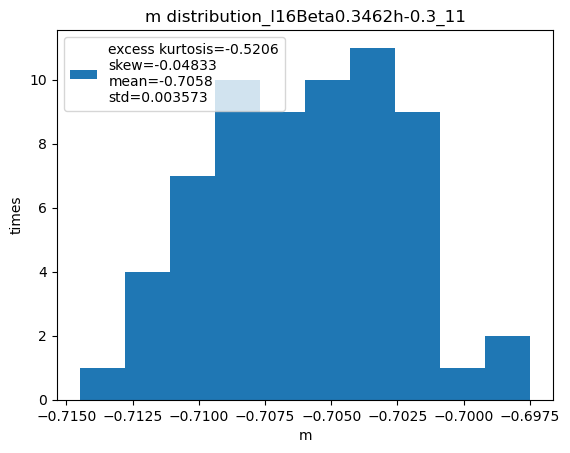

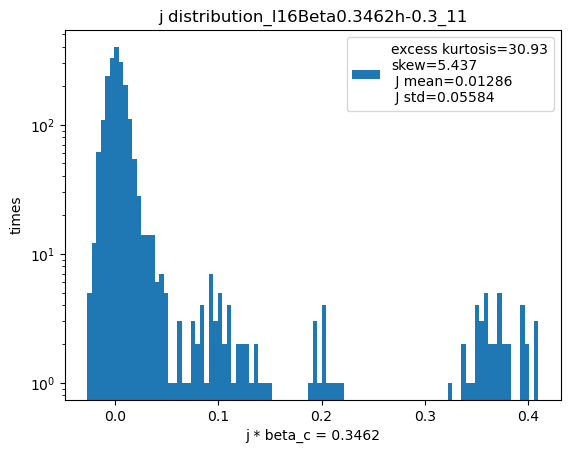

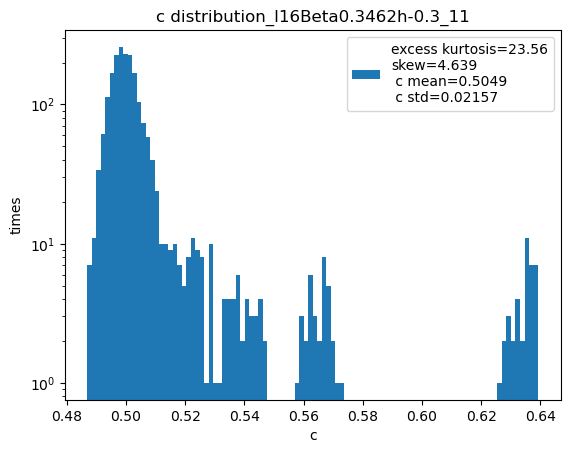

<Figure size 640x480 with 0 Axes>

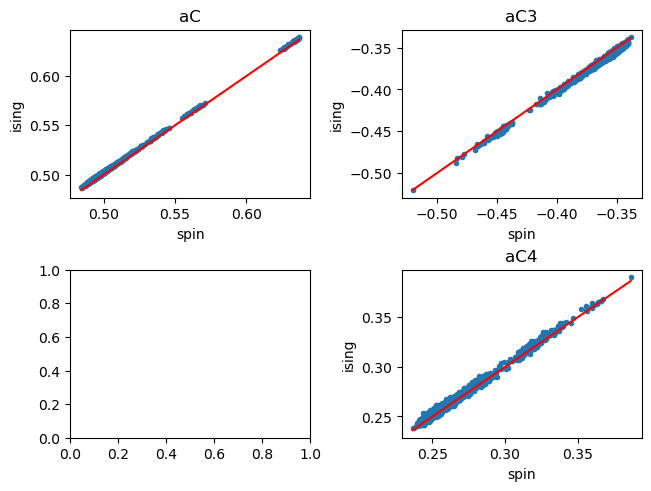

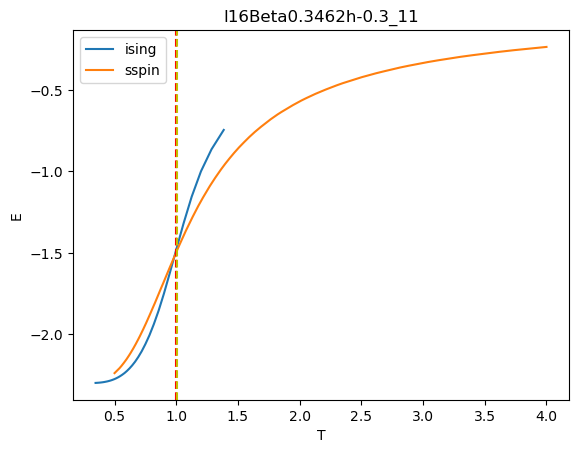

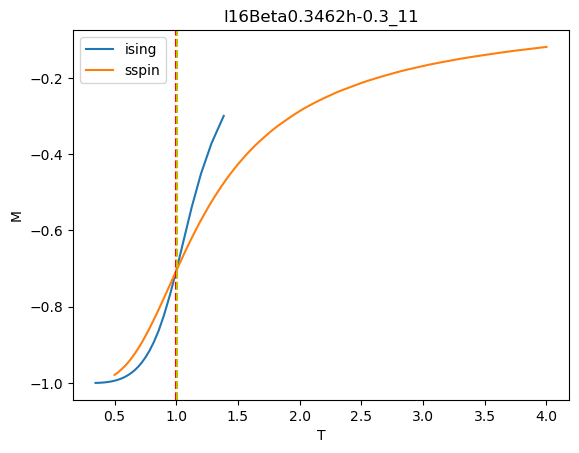

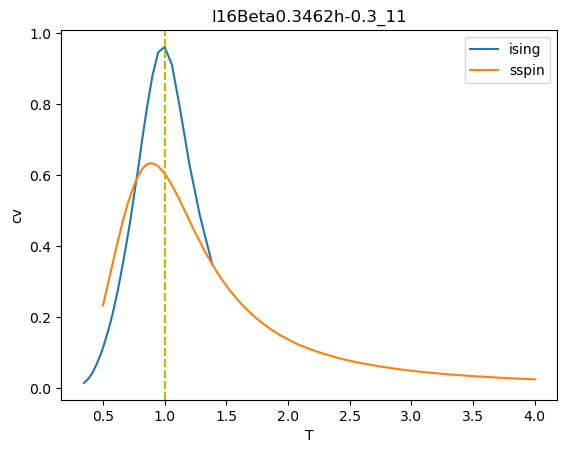

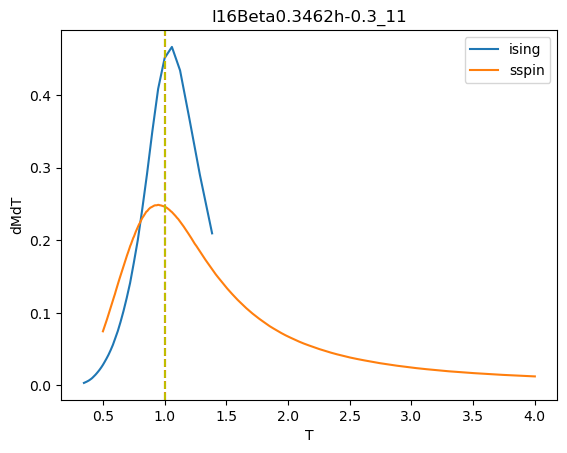

<Figure size 640x480 with 0 Axes>

In [21]:
file=glob('blresult/aC4/blresult_*.npz')
sspinbetas=np.linspace(0.25,2,200)
isingbetas=np.linspace(0.25,1,40)
# betas=np.linspace(0.25,2,80)
for fn in file:
    # A='h-0.4'in fn
    A='h-0.3' in fn
    B='l16' in fn
    if A== True:
        if B==True:
        # print(fn)
            sspindatalist=[]
            isingdatalist=[]
            isingaClist=[]
            sspinaClist=[]
            n=stringN(fn)
            
            readouput(n,isingbetas,sspinbetas,sspindatalist,sspinaClist,isingdatalist,isingaClist)

In [15]:
np.linspace(0.25,2,120)

array([0.25      , 0.26470588, 0.27941176, 0.29411765, 0.30882353,
       0.32352941, 0.33823529, 0.35294118, 0.36764706, 0.38235294,
       0.39705882, 0.41176471, 0.42647059, 0.44117647, 0.45588235,
       0.47058824, 0.48529412, 0.5       , 0.51470588, 0.52941176,
       0.54411765, 0.55882353, 0.57352941, 0.58823529, 0.60294118,
       0.61764706, 0.63235294, 0.64705882, 0.66176471, 0.67647059,
       0.69117647, 0.70588235, 0.72058824, 0.73529412, 0.75      ,
       0.76470588, 0.77941176, 0.79411765, 0.80882353, 0.82352941,
       0.83823529, 0.85294118, 0.86764706, 0.88235294, 0.89705882,
       0.91176471, 0.92647059, 0.94117647, 0.95588235, 0.97058824,
       0.98529412, 1.        , 1.01470588, 1.02941176, 1.04411765,
       1.05882353, 1.07352941, 1.08823529, 1.10294118, 1.11764706,
       1.13235294, 1.14705882, 1.16176471, 1.17647059, 1.19117647,
       1.20588235, 1.22058824, 1.23529412, 1.25      , 1.26470588,
       1.27941176, 1.29411765, 1.30882353, 1.32352941, 1.33823

/tmp/ipykernel_56048/906776182.py:233: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


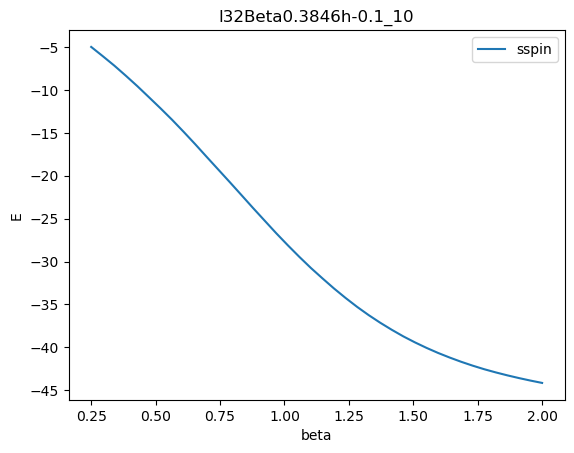

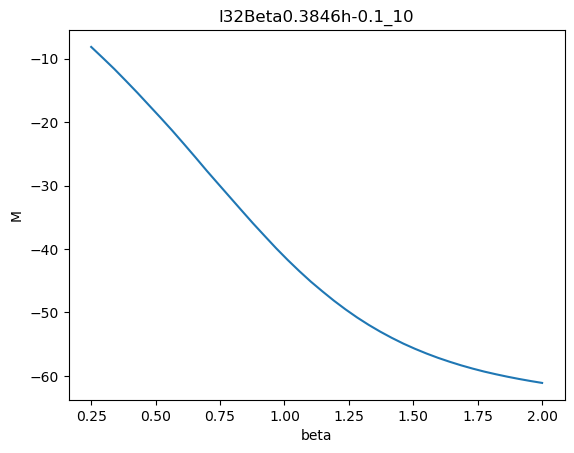

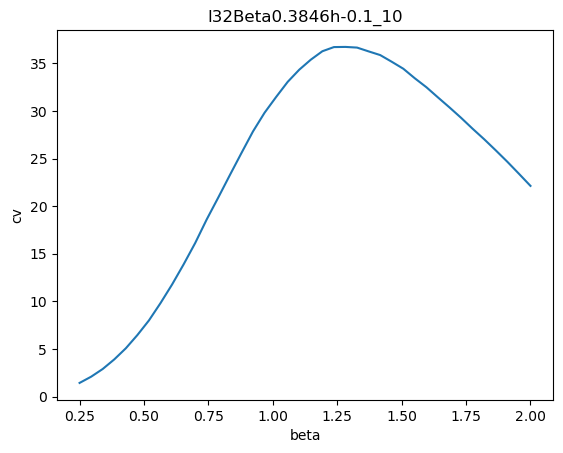

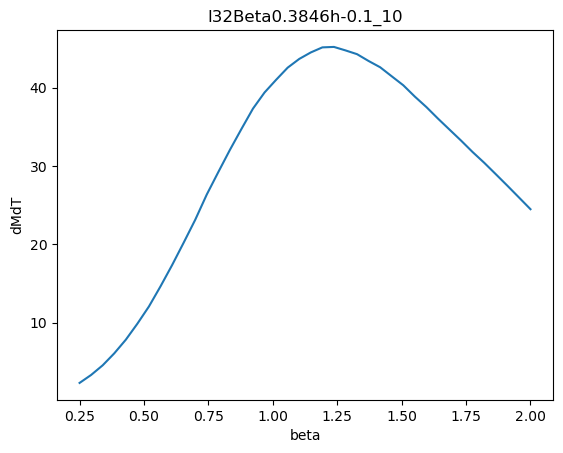

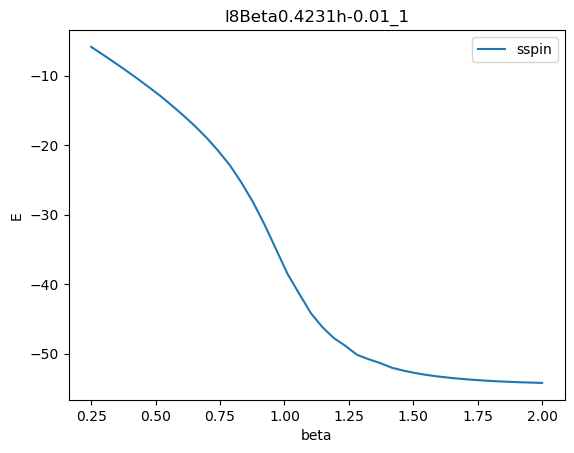

...

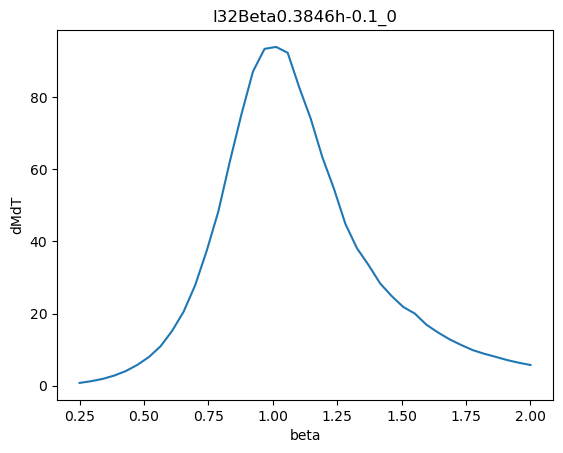

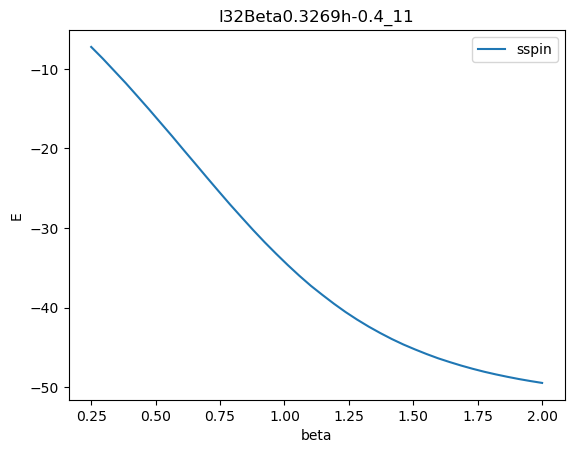

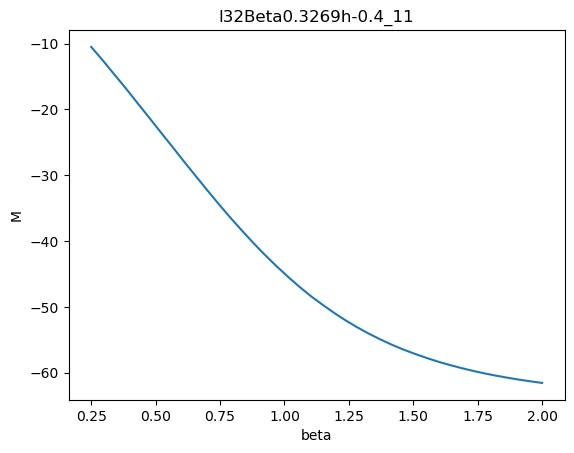

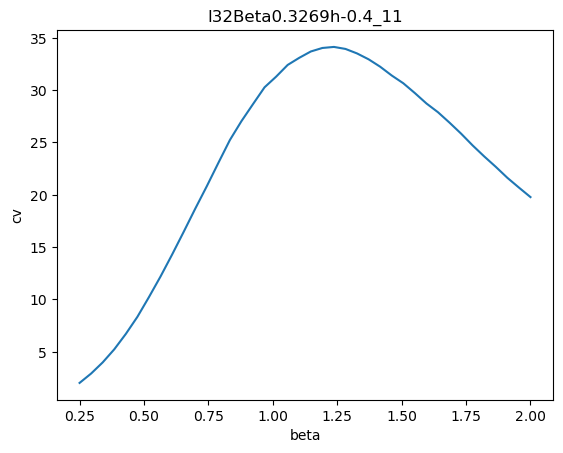

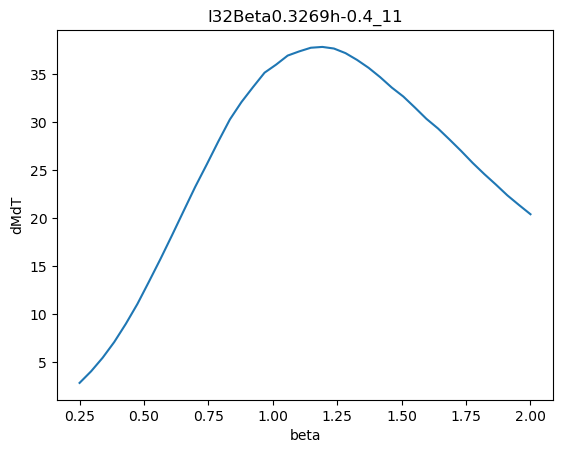

<Figure size 640x480 with 0 Axes>

In [3]:
file=glob('blresult/aC4/blresult_*.npz')
# print(len(file))
sspinbetas=np.linspace(0.25,2,40)
isingbetas=np.linspace(0.25,1,40)

for fn in file:
    sspindatalist=[]
    isingdatalist=[]
    isingaClist=[]
    sspinaClist=[]
    n=stringN(fn)
    # print(n)
    readouput(n,isingbetas,sspinbetas,sspindatalist,sspinaClist,isingdatalist,isingaClist)

In [129]:
file=glob('blresult/aC4/blresult_*.npz')
# print(len(file[0]))
n1=stringN(file[0])
# print(n)
# n=file[0].split('/')[-1]
# print(n)
# n=n.split('blresult_')[1]
# print(n)
# n=n.split('.npz')[0]
# print(n)
# split_filename(n)

In [31]:

    # print(n)

9
9
20
24
5
4
3
9


/tmp/ipykernel_240782/99828575.py:62: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


8
7
7
5
4
3
9
8
7
6
5
4
3


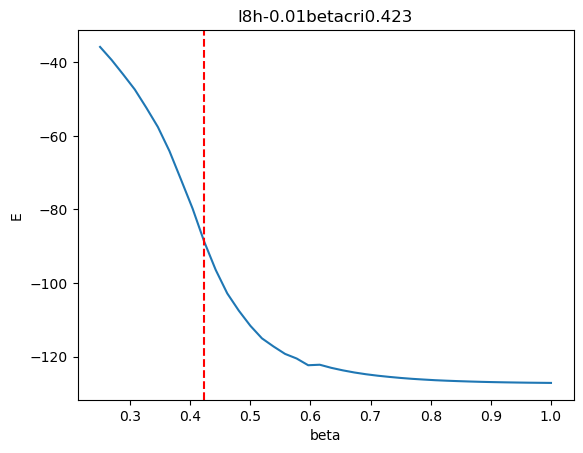

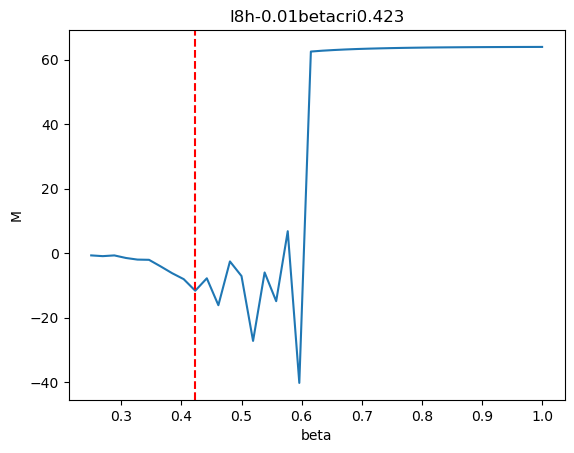

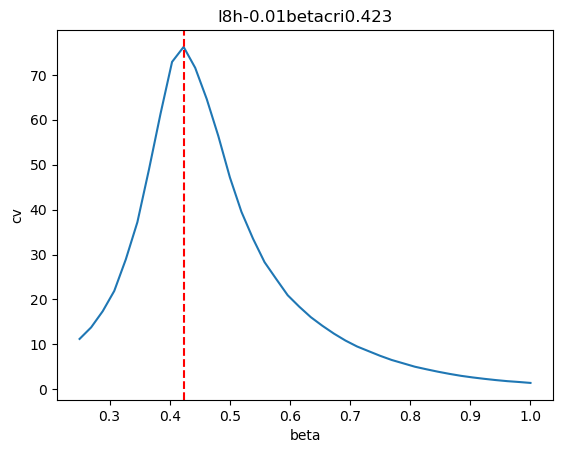

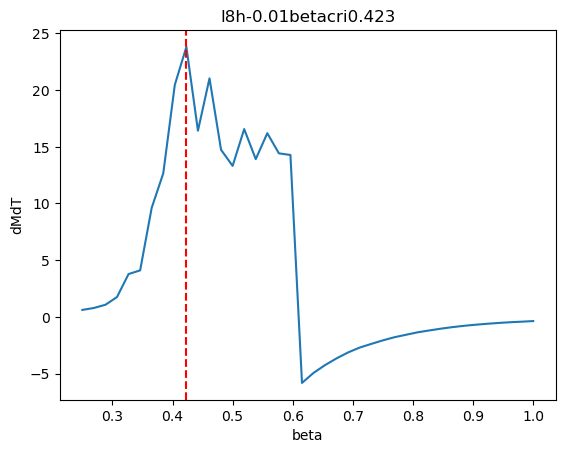

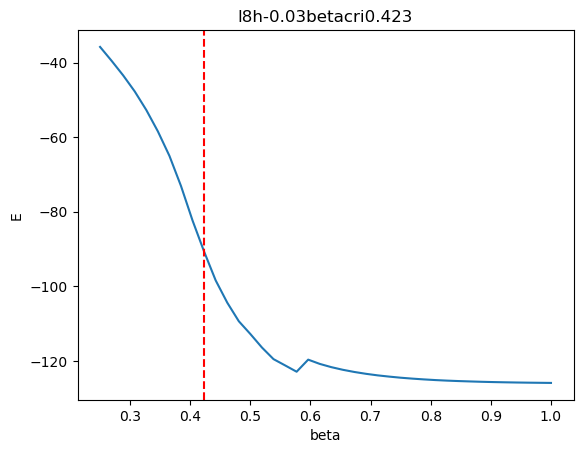

...

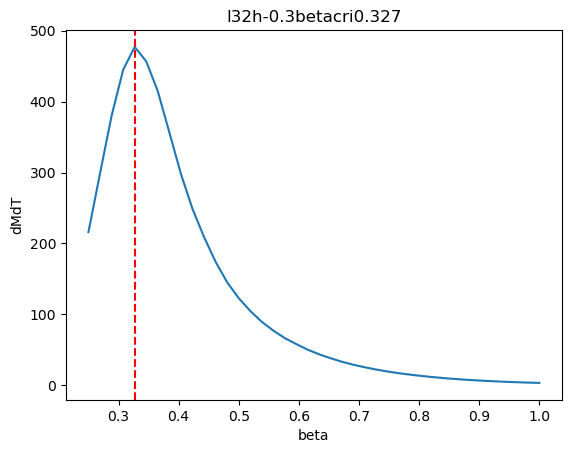

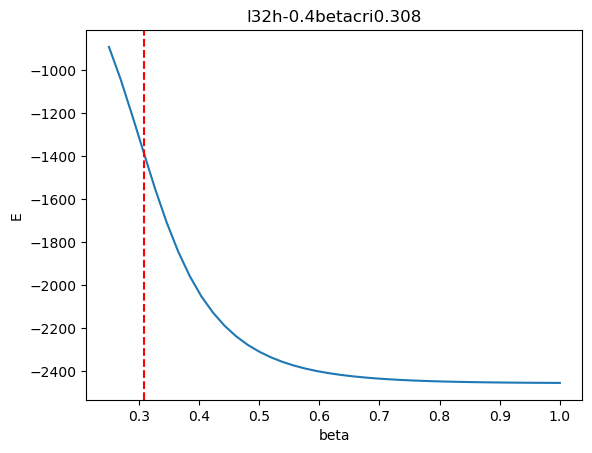

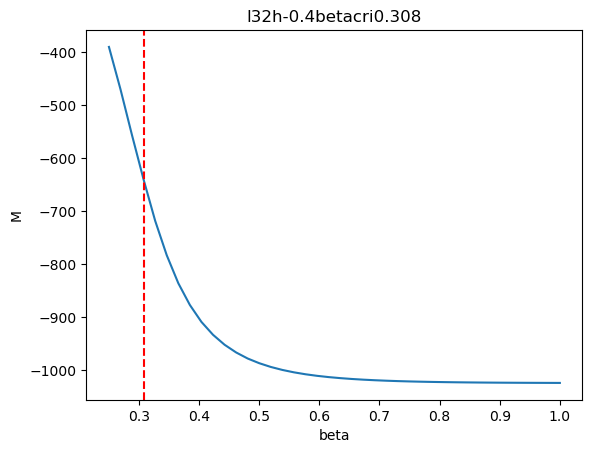

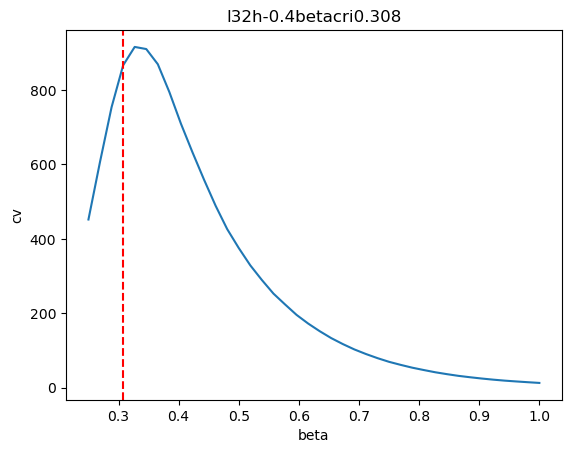

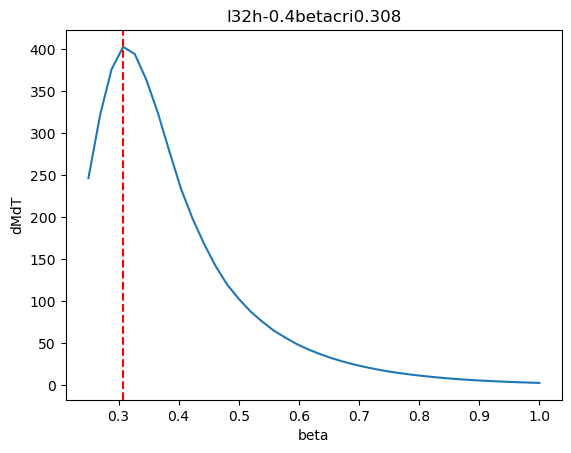

<Figure size 640x480 with 0 Axes>

In [20]:
fn=glob('selection_mc/aC4/statics*-0.01.h5')

betas=np.linspace(0.25,1,40)
linear_sizes=[8,16,32]
fields=[-0.01,-0.03,-0.06,-0.1,-0.2,-0.3,-0.4]
filenumbers=[0,1,10,11]
datalist=[]
aClist=[]
critical_beta=[]
betacris=[0.3654,0.3462,0.4038,0.3462,0.6846]
# print(fn)
for linear_size in linear_sizes:
    for field in fields:
        
        for beta in betas:
            filename=f'selection_mc/aC4/statics_l{linear_size:.04g}Beta{beta:.04g}h{field:.04g}.h5'
            readcv(filename,beta,datalist)
        # for filenumber in filenumbers:
        #     filename=f'selection_mc/aC4/statics_l{linear_size:.04g}Beta{beta:.04g}h{field:.04g}_{filenumber:.04g}.h5'
        #     readaC
            


        # print(ising_index:=np.argmin(np.abs(np.array(datalist[3::4])-max(datalist[3::4]))))
        # critical_beta.append(ising_index)
        # plotcv(betas,ising_index,f'l{linear_size:.03g}h{field:.03g}',datalist)
    # print(filename)
# for file in fn:
    # print(file)